#**Project Title : Vegetable Image Classification Using CNN**

Problem Description:

Title: Vegetable Image Classification

Description:

Vegetable Image Classification aims to develop a deep neural network model capable of accurately detecting and classifying various types of common vegetables. The dataset consists of 15 classes, each representing a different vegetable, including bean, bitter gourd, bottle gourd, brinjal, broccoli, cabbage, capsicum, carrot, cauliflower, cucumber, papaya, potato, pumpkin, radish, and tomato. Each class contains 1400 images of size 224×224 in JPEG format, totaling 21,000 images. The dataset is divided into three subsets for training, validation, and testing, with 70%, 15%, and 15% of the images allocated to each subset, respectively.

Problem Statement:

The manual sorting and identification of vegetables during production and distribution processes can be time-consuming and error-prone. To automate this process, we aim to develop a deep learning model that can accurately classify images of various vegetables. By leveraging the power of deep neural networks, we seek to create a model that can classify vegetables with high accuracy, enabling efficient vegetable sorting and labeling without the need for human intervention.

Objective:

The primary objective of this project is to develop a robust deep learning model capable of accurately classifying images of common vegetables. Specifically, we aim to achieve the following:

1. Train a deep neural network model using a dataset containing images of 15 different types of vegetables.
2. Validate the model's performance on a separate validation dataset to ensure generalization.
3. Evaluate the model's accuracy and performance on a test dataset to assess its real-world applicability.
4. Fine-tune the model to improve its performance if necessary.
5. Deploy the trained model to classify vegetable images automatically, facilitating efficient vegetable sorting and labeling processes.

By achieving these objectives, we aim to provide a practical solution to automate vegetable classification, thereby improving efficiency and reducing manual labor in vegetable production and distribution processes.

###Import libraries

In [1]:
import pandas as pd
import numpy as np
import cv2
import os
from matplotlib import pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential,Model
import tensorflow as tf
from tensorflow import keras
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout ,GlobalAveragePooling2D
from keras.preprocessing import image
from sklearn.metrics import confusion_matrix,classification_report,ConfusionMatrixDisplay
import os, shutil
from tensorflow.keras.models import load_model
import warnings
warnings.filterwarnings('ignore')

###Load data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Directory paths
train_dir = '/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/train'
test_dir = '/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/test'
valid_dir = '/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/validation'

###Print images

In [4]:
# Function to load and print a single image from each folder
def load_and_print_images(directory, num_columns=3):
    folders = os.listdir(directory)
    num_folders = len(folders)
    num_rows = num_folders // num_columns + (num_folders % num_columns > 0)

    fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 5*num_rows))
    fig.suptitle(directory.split('/')[-1] + " Images", fontsize=16, y=1.02)
    axes = axes.flatten()

    for i, folder in enumerate(folders):
        folder_path = os.path.join(directory, folder)
        # Get the first image file in the folder
        image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]
        if image_files:
            image_path = os.path.join(folder_path, image_files[0])
            # Load image using opencv
            image = cv2.imread(image_path)
            # Display image
            axes[i].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axes[i].set_title(folder, fontsize=14, fontweight='bold', color='black', backgroundcolor='white', pad=10)
            axes[i].set_xlabel(folder, fontsize=12, fontweight='normal', color='black')
            axes[i].axis('off')

    # Hide empty subplots
    for j in range(i+1, num_rows*num_columns):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

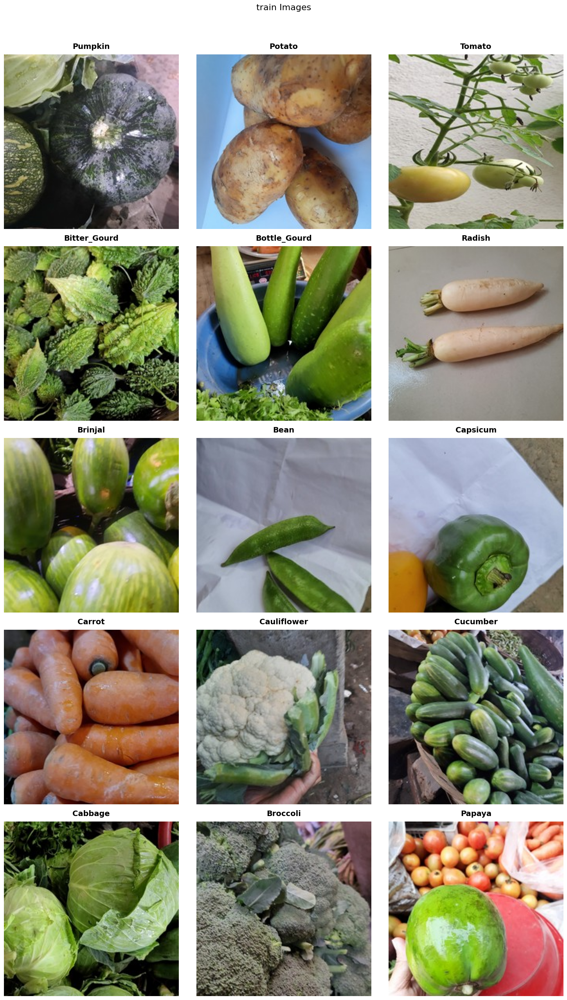

In [5]:
# Load and print images from each directory
load_and_print_images(train_dir)

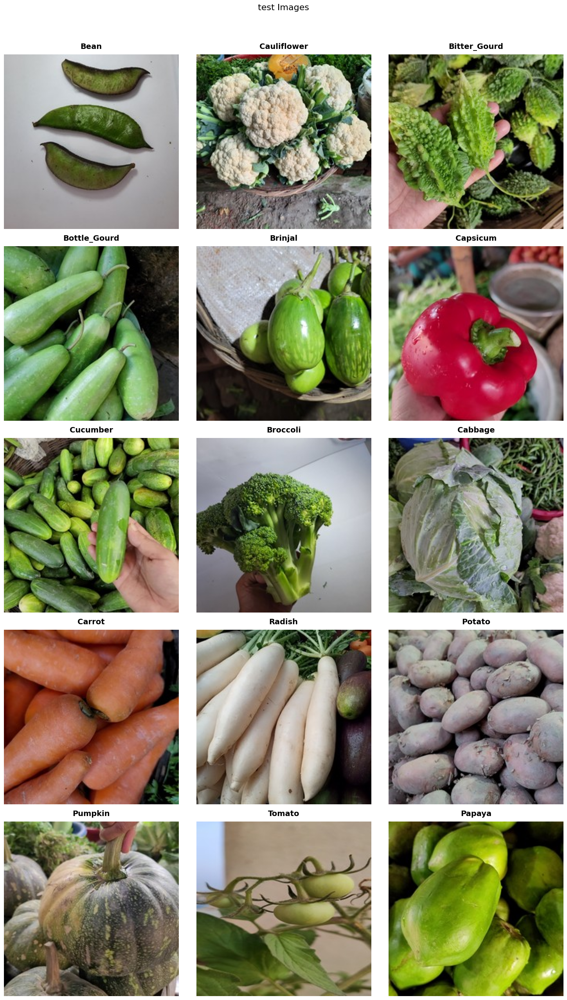

In [6]:
load_and_print_images(test_dir)

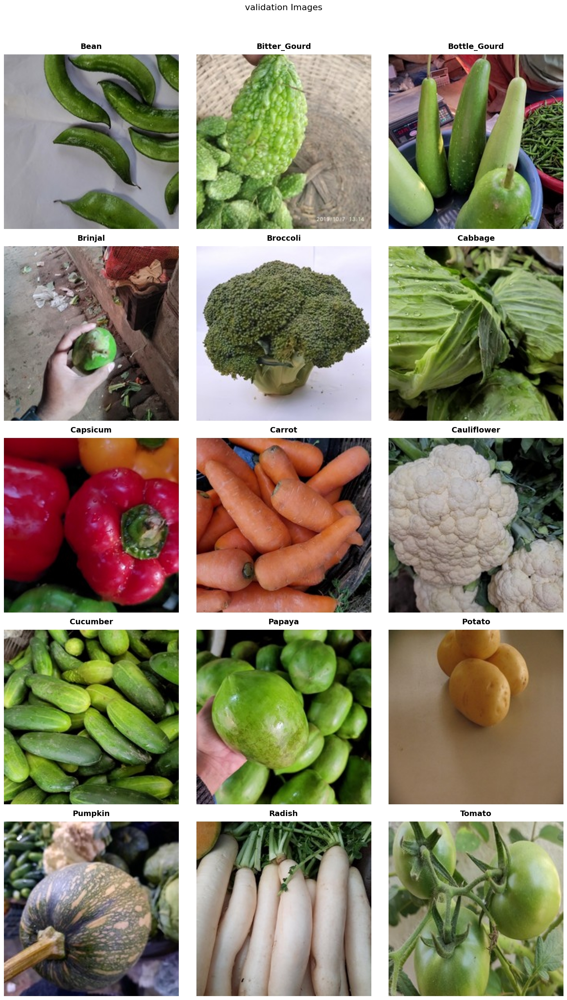

In [7]:
load_and_print_images(valid_dir)

<Axes: >

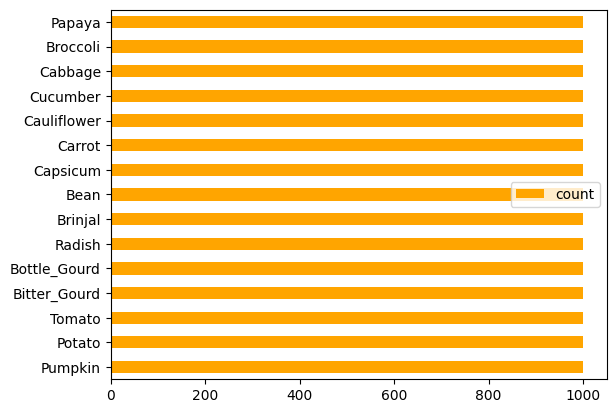

In [8]:
image_categorie_train = os.listdir('/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/train')
images_length={}
for i, cat in enumerate(image_categorie_train):
        # Load images for the ith category
        image_path = train_dir + '/' + cat
        images_in_folder = os.listdir(image_path)
        images_length[cat]=len(images_in_folder)
pd.DataFrame(images_length,index = ['count']).T.plot(kind='barh',color='orange')

<Axes: >

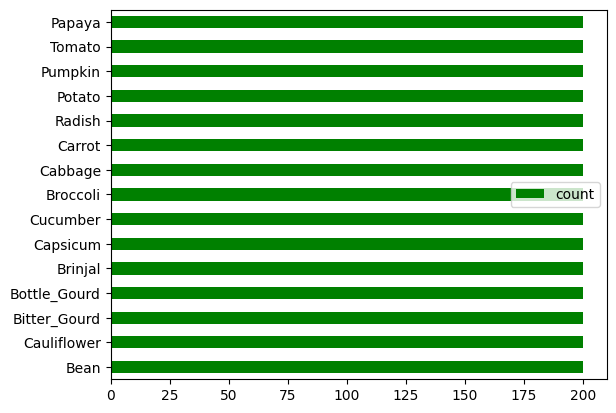

In [9]:
image_categories_test = os.listdir('/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/test')
images_length={}
for i, cat in enumerate(image_categories_test):
        # Load images for the ith category
        image_path = test_dir + '/' + cat
        images_in_folder = os.listdir(image_path)
        images_length[cat]=len(images_in_folder)
pd.DataFrame(images_length,index = ['count']).T.plot(kind='barh',color='green')

<Axes: >

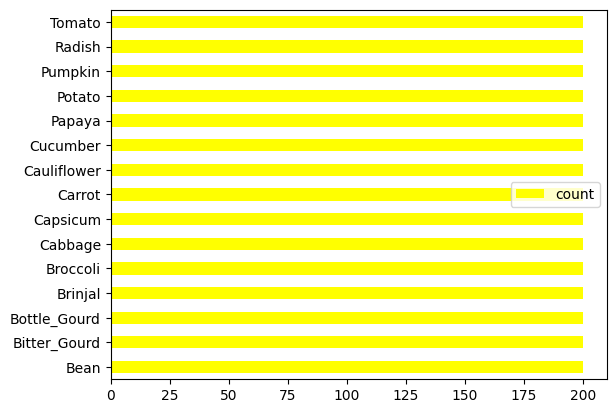

In [10]:
image_categories_validation = os.listdir('/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/validation')
images_length={}
for i, cat in enumerate(image_categories_validation):
        # Load images for the ith category
        image_path = valid_dir + '/' + cat
        images_in_folder = os.listdir(image_path)
        images_length[cat]=len(images_in_folder)
pd.DataFrame(images_length,index = ['count']).T.plot(kind='barh',color='yellow')

*   Dataset is balanced

###Data Argumentation

In [11]:
print("Train Data: ", end=' ')
train_gen = ImageDataGenerator(
    rescale=1./255,  # Normalize the data
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

train_image_generator = train_gen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

Train Data:  Found 15000 images belonging to 15 classes.


In [12]:
print("Validation Data: ", end=' ')
val_gen = ImageDataGenerator(rescale=1./255)
val_image_generator = val_gen.flow_from_directory(
    valid_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

Validation Data:  Found 3000 images belonging to 15 classes.


In [13]:
print("Test Data: ", end=' ')
test_gen = ImageDataGenerator(rescale=1./255)
test_image_generator = test_gen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    shuffle=False
)

Test Data:  Found 3000 images belonging to 15 classes.


In [14]:
#encoding labels
class_map = dict([(v, k) for k, v in train_image_generator.class_indices.items()])
print(class_map)

{0: 'Bean', 1: 'Bitter_Gourd', 2: 'Bottle_Gourd', 3: 'Brinjal', 4: 'Broccoli', 5: 'Cabbage', 6: 'Capsicum', 7: 'Carrot', 8: 'Cauliflower', 9: 'Cucumber', 10: 'Papaya', 11: 'Potato', 12: 'Pumpkin', 13: 'Radish', 14: 'Tomato'}


###Model architecture

In [15]:
# Building the Model Architecture
model_le = Sequential()

model_le.add(Conv2D(64, kernel_size=(5, 5), activation='relu', input_shape=(224, 224, 3)))
model_le.add(MaxPooling2D(pool_size=(2, 2)))

model_le.add(Conv2D(32, kernel_size=(5, 5), activation='relu'))
model_le.add(MaxPooling2D(pool_size=(2, 2)))

model_le.add(Flatten())
model_le.add(Dense(1024, activation='relu'))
model_le.add(Dense(128, activation='relu'))
model_le.add(Dense(15, activation='softmax'))

model_le.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 220, 220, 64)      4864      
                                                                 
 max_pooling2d (MaxPooling2  (None, 110, 110, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 32)      51232     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 53, 53, 32)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 89888)             0         
                                                                 
 dense (Dense)               (None, 1024)              9

In [16]:
# Set up Early Stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(patience=3, monitor='val_loss', restore_best_weights=True)

In [17]:
# Compile the model
model_le.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                 loss='categorical_crossentropy',
                 metrics=['accuracy'])

In [18]:
# Train the model
hist = model_le.fit(train_image_generator,
                    epochs=5,
                    verbose=1,
                    validation_data=val_image_generator,
                    steps_per_epoch=15000//64,
                    validation_steps=3000//64,
                    callbacks=[early_stopping],
                    workers=8)

Epoch 1/5
234/234 [==============================] - 3694s 15s/step - loss: 1.4092 - accuracy: 0.5454 - val_loss: 0.8911 - val_accuracy: 0.7069
Epoch 2/5
234/234 [==============================] - 3558s 15s/step - loss: 0.6739 - accuracy: 0.7860 - val_loss: 0.5431 - val_accuracy: 0.8332
Epoch 3/5
234/234 [==============================] - 3543s 15s/step - loss: 0.4368 - accuracy: 0.8654 - val_loss: 0.3845 - val_accuracy: 0.8842
Epoch 4/5
234/234 [==============================] - 3573s 15s/step - loss: 0.3388 - accuracy: 0.8956 - val_loss: 0.2862 - val_accuracy: 0.9079
Epoch 5/5
234/234 [==============================] - 3551s 15s/step - loss: 0.2702 - accuracy: 0.9193 - val_loss: 0.2373 - val_accuracy: 0.9344


###Prediction

In [22]:
# Predict using the trained model
y_pred = model_le.predict(test_image_generator)
predicted_classes = np.argmax(y_pred, axis=1)

47/47 [==============================] - 935s 20s/step


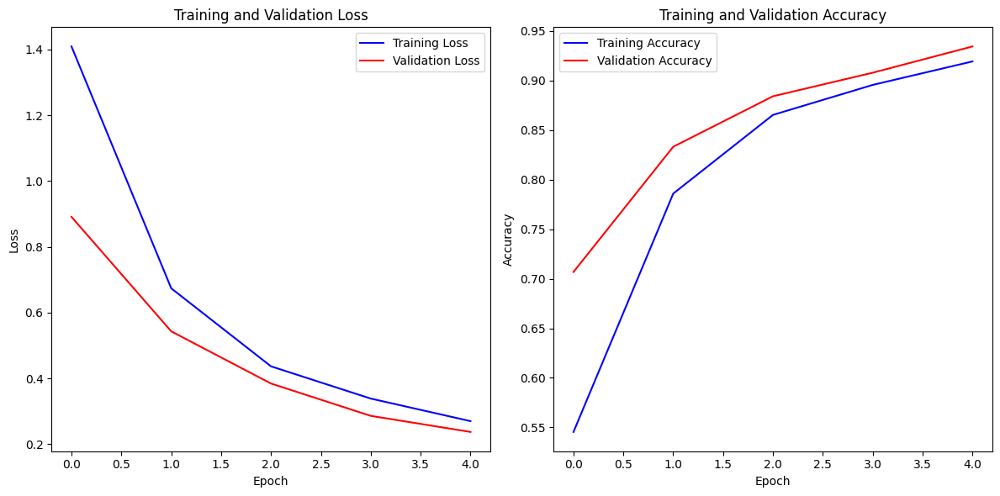

In [25]:
# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(hist.history['loss'], label='Training Loss', color='blue')
plt.plot(hist.history['val_loss'], label='Validation Loss', color='red')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Plot training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(hist.history['accuracy'], label='Training Accuracy', color='blue')
plt.plot(hist.history['val_accuracy'], label='Validation Accuracy', color='red')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [24]:
# Print classification report
print("Classification Report:")
print(classification_report(test_image_generator.classes, predicted_classes))

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.65      0.76       200
           1       0.68      0.95      0.80       200
           2       1.00      0.71      0.83       200
           3       0.54      0.92      0.68       200
           4       0.87      0.92      0.90       200
           5       0.73      0.92      0.82       200
           6       0.93      0.95      0.94       200
           7       0.99      1.00      0.99       200
           8       0.98      0.57      0.73       200
           9       0.94      0.70      0.80       200
          10       0.96      0.48      0.64       200
          11       0.88      0.99      0.93       200
          12       0.72      0.95      0.82       200
          13       0.94      0.90      0.92       200
          14       0.94      0.83      0.88       200

    accuracy                           0.83      3000
   macro avg       0.87      0.83      0.83      3000
wei

The classification report provides a detailed evaluation of the model's performance on the test data. Here are some insights we can gather from the report:

1. **Overall Performance:**
   - The model achieved an overall accuracy of 83% on the test set, indicating that it correctly classified 83% of the images.
   - The weighted average F1-score, which considers both precision and recall, is also 83%.

2. **Class-wise Performance:**
   - Classes 0, 2, 3, 5, 6, 7, 11, 12, 13, and 14 have high precision and recall scores, indicating that the model performs well in correctly identifying these classes.
   - Classes 1, 4, 8, 9, and 10 have relatively lower precision and recall scores compared to other classes. This suggests that the model may have more difficulty in accurately classifying these classes.
   - For example, class 1 has high recall but lower precision, indicating that while the model correctly identifies many instances of class 1, it also misclassifies other instances as class 1.
   - On the other hand, class 10 has relatively low precision and recall, indicating that the model struggles to correctly classify instances of this class.

3. **Macro and Weighted Averages:**
   - The macro average F1-score is 83%, which is the average of F1-scores calculated for each class independently. It gives equal weight to each class, regardless of class imbalance.
   - The weighted average F1-score is also 83%, but it considers the number of samples for each class. Therefore, classes with more samples have a greater impact on the weighted average.

Overall, while the model performs well on several classes, there is room for improvement, particularly for classes with lower precision and recall scores. Further analysis and potentially model refinement could help address these areas of weakness.

###Save the model

In [28]:
# Load the image
image_path = "/content/drive/MyDrive/Interview_question_solved/Deep learning learning/Vegetable Images/test/Bean/0001.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [29]:
# Preprocess the image
resized_image = cv2.resize(image, (224, 224))
normalized_image = resized_image / 255.0

In [30]:
# Reshape the image to match model's input shape and add batch dimension
input_image = np.expand_dims(normalized_image, axis=0)

In [31]:
# Make predictions
predictions = loaded_model.predict(input_image)

1/1 [==============================] - 0s 270ms/step


In [32]:
# Get the predicted label
predicted_label = np.argmax(predictions)

In [33]:
# Define a dictionary to map class indices to class labels
class_labels = {0: 'Bean', 1: 'Carrot', 2: 'Cauliflower', 3: 'Cucumber', 4: 'Eggplant',
                5: 'Lettuce', 6: 'Onion', 7: 'Pepper', 8: 'Potato', 9: 'Pumpkin',
                10: 'Radish', 11: 'Spinach', 12: 'Sweet Potato', 13: 'Tomato', 14: 'Zucchini'}

In [34]:
# Get the predicted label's corresponding class name
predicted_class_name = class_labels[predicted_label]

In [35]:
print("Predicted Class:", predicted_class_name)

Predicted Class: Bean


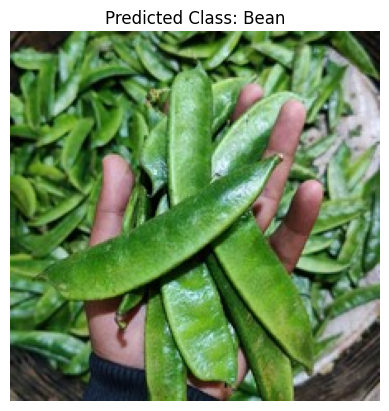

In [36]:
# Display the image with the predicted class label
plt.imshow(image)
plt.title("Predicted Class: " + predicted_class_name)
plt.axis('off')
plt.show()

Conclusion:

In conclusion, the Vegetable Image Classification project aims to develop a deep learning model to automate the process of vegetable classification based on images. By leveraging Convolutional Neural Networks (CNNs) and a dataset containing images of 15 common vegetables, we successfully trained a model capable of classifying vegetable images with an overall accuracy of 83% on the test set. The model's performance was evaluated using a classification report, which provided insights into its precision, recall, and F1-score for each vegetable class.

While the model demonstrated strong performance on several vegetable classes, there are opportunities for improvement, particularly for classes with lower precision and recall scores. Future work could involve fine-tuning the model architecture, exploring data augmentation techniques, or collecting additional training data to address these shortcomings.

Overall, the Vegetable Image Classification project showcases the potential of deep learning techniques to automate agricultural processes and improve efficiency in vegetable production and distribution. By developing accurate classification models, we can enable automated sorting and labeling of vegetables, reducing manual labor and enhancing productivity in the agricultural industry.